## Feature Selection

In [43]:
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, mean_squared_error, mean_absolute_percentage_error, accuracy_score

sns.set_style('whitegrid') # set style for visualization
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('../data/engineered_features.csv', encoding='utf-8')
df

,SUBJECT_ID,SESSION_ID,TRIAL_ID,c_ml_min_r,c_ml_max_r,c_ml_min_l,c_ml_max_l,c_ap_slope_r,c_ap_slope_l,g_ml_max1_r,...,g_v_min_l,g_v_max2_l,diff_v1,diff_v2,diff_ap1,diff_ap2,AGE,BMI,CLASS_LABEL,SPEED
0,510,413,1,0.087271,0.118247,0.087814,0.128115,0.001718,0.002493,0.072643,...,0.796622,1.003385,0.425223,0.260852,0.096354,0.057032,47,35.538442,C,2
1,510,413,2,0.085806,0.128396,0.040212,0.083074,0.001589,0.001834,0.072360,...,0.837006,0.999401,0.322656,0.272089,0.071507,0.056424,47,35.538442,C,2
2,510,413,3,0.073788,0.112735,0.049990,0.099952,0.001740,0.001734,0.059417,...,0.815221,1.003578,0.298372,0.244674,0.054891,0.057072,47,35.538442,C,2
3,510,413,4,0.056216,0.102832,0.086729,0.127982,0.001919,0.001361,0.079792,...,0.773203,1.021851,0.316671,0.290747,0.072747,0.063221,47,35.538442,C,2
4,510,413,6,0.064922,0.102404,0.000573,0.052266,0.001837,0.002049,0.059537,...,0.820851,1.027245,0.374801,0.332217,0.116513,0.083453,47,35.538442,C,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43619,93,999910373,7,-0.019602,-0.001001,0.103706,0.140610,0.001320,0.001493,0.035459,...,0.776455,1.163370,0.134546,0.079414,0.046175,0.027730,53,21.651307,HC,2
43620,93,999910373,8,0.053761,0.060738,-0.024844,-0.006204,0.001334,0.002134,0.046960,...,0.753378,1.144916,0.159847,0.284077,0.038476,0.128401,53,21.651307,HC,2
43621,93,999910373,9,0.043214,0.068197,0.038681,0.053585,0.001676,0.001885,0.047020,...,0.764046,1.153042,0.180381,0.065231,0.071944,0.036908,53,21.651307,HC,2
43622,93,999910373,10,0.049181,0.060193,-0.036239,-0.007429,0.002073,0.001640,0.026953,...,0.779464,1.158905,0.149181,0.245195,0.031198,0.115095,53,21.651307,HC,2


In [3]:
df.shape

(43624, 33)

<AxesSubplot:xlabel='CLASS_LABEL'>

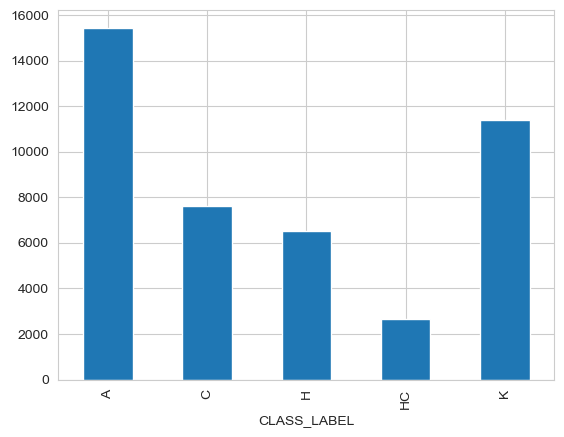

In [4]:
df.groupby(['CLASS_LABEL']).size().plot.bar()

In [5]:
df.isna().sum().loc[lambda x : x>0].sort_values(ascending=False)

Series([], dtype: int64)

In [6]:
for i in list(df.columns):
    print(f"{i} : {df[i].dtypes}")

SUBJECT_ID : int64
SESSION_ID : int64
TRIAL_ID : int64
c_ml_min_r : float64
c_ml_max_r : float64
c_ml_min_l : float64
c_ml_max_l : float64
c_ap_slope_r : float64
c_ap_slope_l : float64
g_ml_max1_r : float64
g_ml_min_r : float64
g_ml_max2_r : float64
g_ml_max1_l : float64
g_ml_min_l : float64
g_ml_max2_l : float64
g_ap_min_r : float64
g_ap_max_r : float64
g_ap_min_l : float64
g_ap_max_l : float64
g_v_max1_r : float64
g_v_min_r : float64
g_v_max2_r : float64
g_v_max1_l : float64
g_v_min_l : float64
g_v_max2_l : float64
diff_v1 : float64
diff_v2 : float64
diff_ap1 : float64
diff_ap2 : float64
AGE : int64
BMI : float64
CLASS_LABEL : object
SPEED : int64


In [9]:
df.loc[(df.CLASS_LABEL=='HC') , df.columns[3:-4]].mean()

c_ml_min_r      0.027038
c_ml_max_r      0.056654
c_ml_min_l      0.029405
c_ml_max_l      0.054713
c_ap_slope_r    0.001912
c_ap_slope_l    0.001973
g_ml_max1_r     0.044364
g_ml_min_r      0.018531
g_ml_max2_r     0.040479
g_ml_max1_l     0.048012
g_ml_min_l      0.018910
g_ml_max2_l     0.038347
g_ap_min_r     -0.179631
g_ap_max_r      0.218222
g_ap_min_l     -0.178770
g_ap_max_l      0.218492
g_v_max1_r      1.113197
g_v_min_r       0.742862
g_v_max2_r      1.110203
g_v_max1_l      1.107598
g_v_min_l       0.744023
g_v_max2_l      1.110529
diff_v1         0.139354
diff_v2         0.082420
diff_ap1        0.059682
diff_ap2        0.050883
dtype: float64

In [11]:
def plot_features(df):
    # Plot
    fig, ax = plt.subplots()
    #HC
    l_hc = mpatches.Patch(color='green', label='HC')
    df.loc[(df.CLASS_LABEL=='HC') , df.columns[3:-4]].mean().plot(color='green')
    #C
    l_c = mpatches.Patch(color='blue', label='C')
    df.loc[(df.CLASS_LABEL=='C') , df.columns[3:-4]].mean().plot(color='blue')
    #A
    l_a = mpatches.Patch(color='orange', label='A')
    df.loc[(df.CLASS_LABEL=='A') , df.columns[3:-4]].mean().plot(color='orange')
    #K
    l_k = mpatches.Patch(color='red', label='K')
    df.loc[(df.CLASS_LABEL=='K') , df.columns[3:-4]].mean().plot(color='red')
    #H
    l_h = mpatches.Patch(color='purple', label='H')
    df.loc[(df.CLASS_LABEL=='H') , df.columns[3:-4]].mean().plot(color='purple')
    
    plt.legend(loc="upper right",handles=[l_hc,l_c,l_a,l_k,l_h])
    plt.title('Participant')
    plt.xlabel('Features')
    plt.locator_params(axis="x", nbins=5)
    plt.ylabel('Data')
    plt.show()

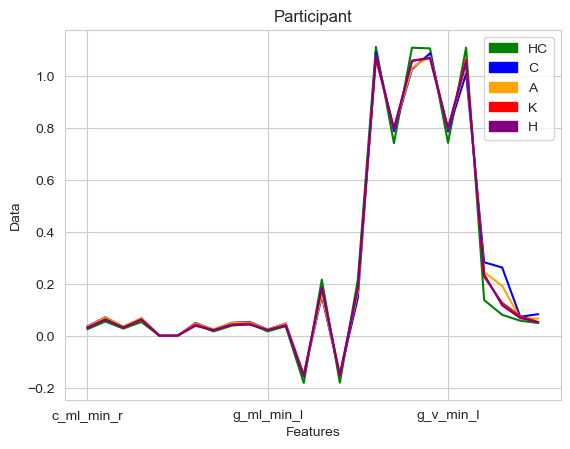

In [12]:
plot_features(df)

### Baseline - Multi-Class Logistic Regression
* Pipeline
* Params Grid
* Get the best model and score

In [14]:
df[['AGE','BMI']].head()

,AGE,BMI
0,47,35.538442
1,47,35.538442
2,47,35.538442
3,47,35.538442
4,47,35.538442


In [15]:
numeric_features = ["AGE", "BMI"]
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="median")), ("scaler", StandardScaler())]
)

categorical_features = []
categorical_transformer = Pipeline(
    steps=[("encoder", OneHotEncoder(handle_unknown="ignore"))]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

clf = Pipeline(
    steps=[("preprocessor", preprocessor), 
           ("classifier", LogisticRegression(solver='lbfgs'))]
)

In [18]:
X = df[['AGE','BMI']]
y = df['CLASS_LABEL']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
clf.fit(X_train, y_train)
print("model score: %.3f" % clf.score(X_test, y_test))

model score: 0.353


* Using age and BMI gives 35% accuracy, which is slightly better than the random model of 20%, given 5 classes.

### Distribution of points

<Figure size 640x480 with 0 Axes>

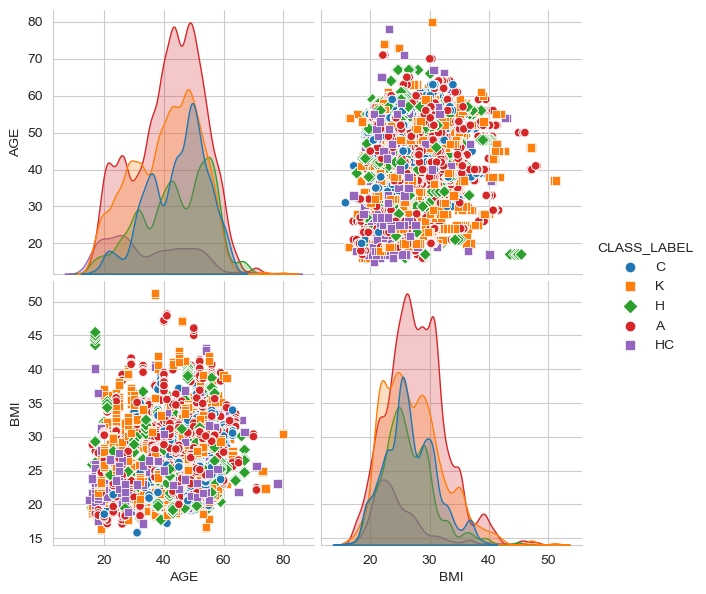

In [24]:
plt.figure()
sns.pairplot(df[['AGE','BMI','CLASS_LABEL']], hue = "CLASS_LABEL", size=3, markers=["o", "s", "D"])
plt.show()

<Figure size 640x480 with 0 Axes>

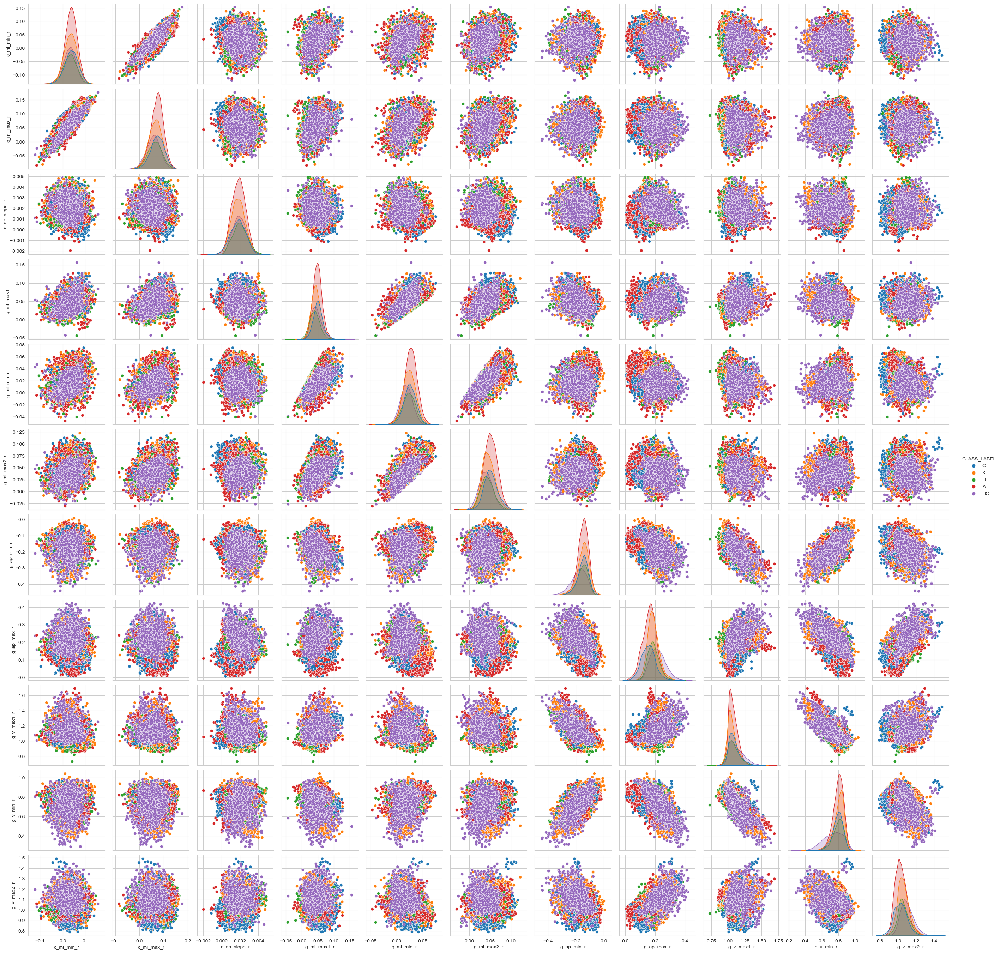

CPU times: total: 13min 59s
Wall time: 14min 55s


In [32]:
%%time
features = ['c_ml_min_r', 'c_ml_max_r',
            'c_ap_slope_r',
            'g_ml_max1_r', 'g_ml_min_r', 
            'g_ml_max2_r', 'g_ap_min_r', 'g_ap_max_r',
            'g_v_max1_r', 'g_v_min_r', 'g_v_max2_r']
plt.figure()
sns.pairplot(df[features+['CLASS_LABEL']], hue = "CLASS_LABEL")
plt.show()

In [39]:
selected = ['diff_v1', 'diff_v2', 'diff_ap1', 'diff_ap2','BMI']

<Figure size 640x480 with 0 Axes>

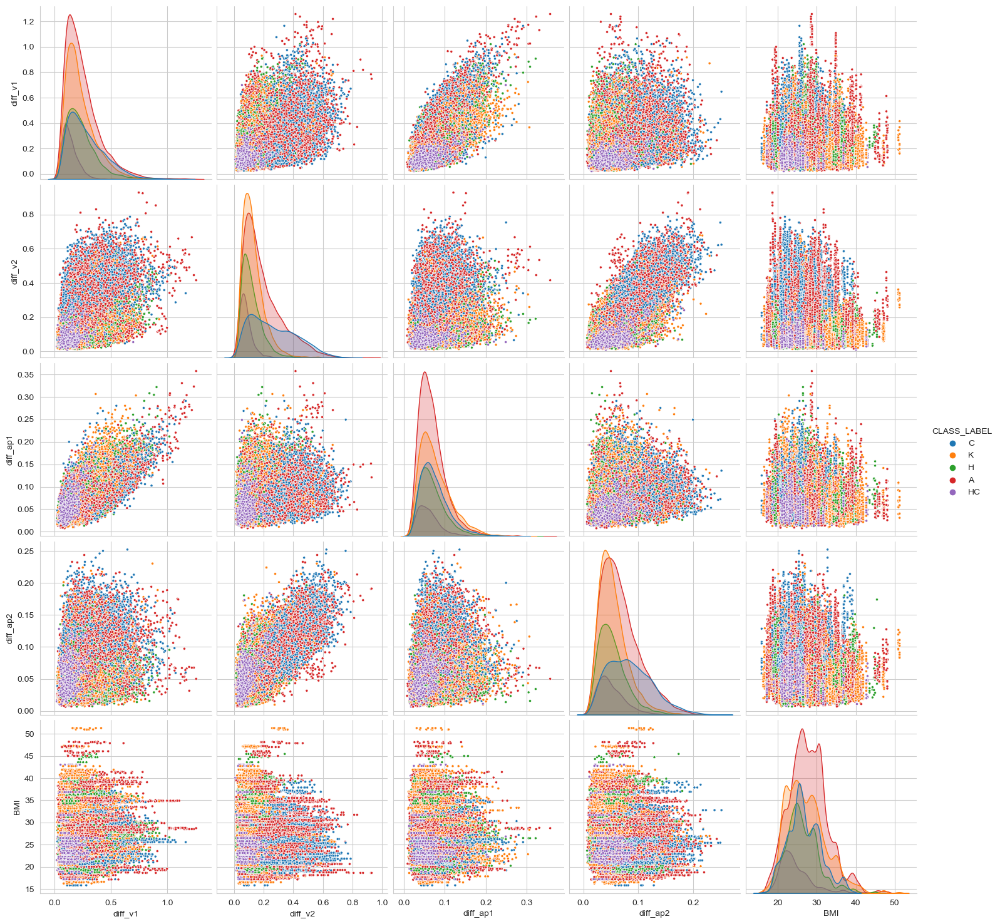

CPU times: total: 48.6 s
Wall time: 53.1 s


In [42]:
%%time
plt.figure()
sns.pairplot(df[selected+['CLASS_LABEL']], hue = "CLASS_LABEL",markers='.',size=3)
plt.show()

**Findings**
* With the new engineered features, we can tell Healthy controls apart from other classes more easily

<Figure size 640x480 with 0 Axes>

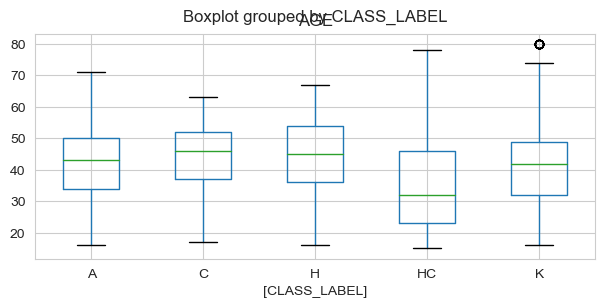

In [50]:
plt.figure()
df[['AGE','CLASS_LABEL']].boxplot(by="CLASS_LABEL", figsize=(7, 3))
plt.show()

<Figure size 640x480 with 0 Axes>

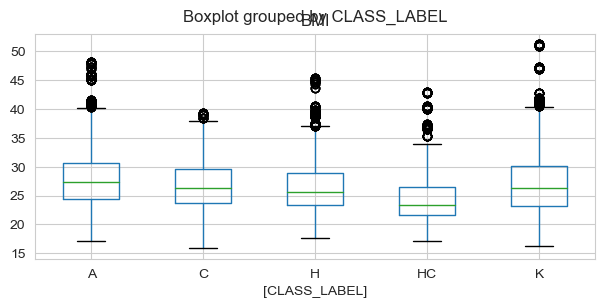

In [52]:
plt.figure()
df[['BMI','CLASS_LABEL']].boxplot(by="CLASS_LABEL", figsize=(7, 3))
plt.show()

<Figure size 640x480 with 0 Axes>

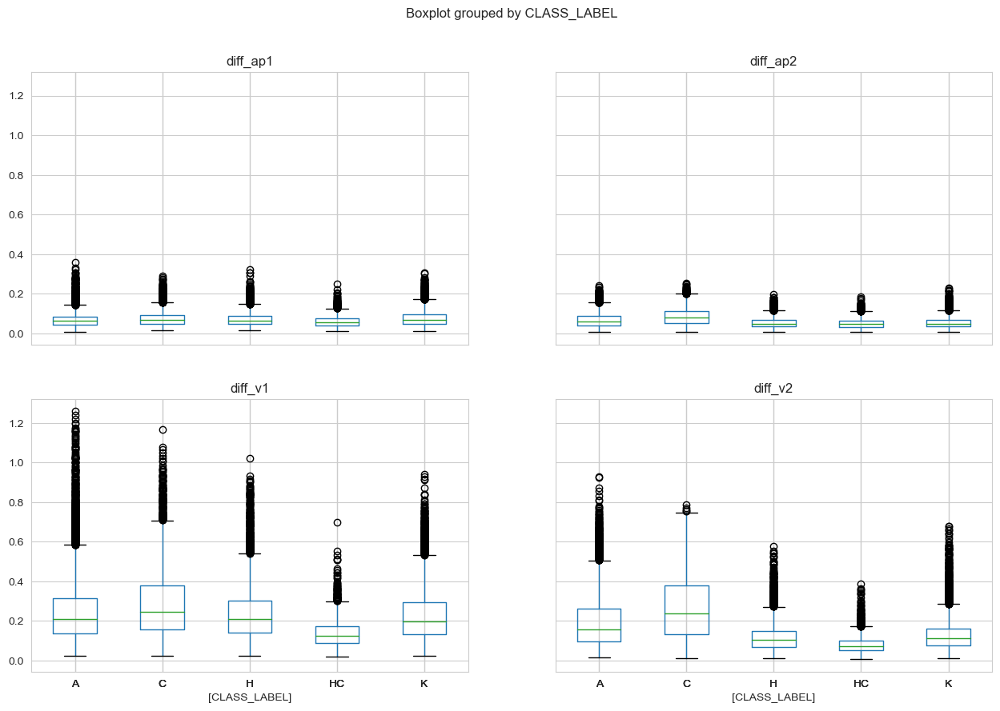

In [35]:
plt.figure()
df[selected+['CLASS_LABEL']].boxplot(by="CLASS_LABEL", figsize=(15, 10))
plt.show()